In [7]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
import torchvision.transforms as transforms
from torchvision import datasets, models

#from imutils import paths
from pathlib import Path
import os, sys
import time
import copy

import pandas as pd
import matplotlib.pylab as plt
import numpy as np

from lucent.optvis import render, param, transform, objectives
from lucent.modelzoo.util import get_model_layers

# Local modules
from cub_tools.train import train_model
from cub_tools.visualize import imshow, visualize_model
from cub_tools.utils import unpickle, save_pickle
from cub_tools.transforms import makeAggresiveTransforms, makeDefaultTransforms, resizeCropTransforms

In [2]:
# Script runtime options
model = 'inception_v3'
root_dir = '..'
data_root_dir = os.path.join(root_dir, 'data')
model_root_dir = os.path.join(root_dir, 'models')
stages = ['test']


# Paths setup
data_dir = os.path.join(data_root_dir,'images')
output_dir = os.path.join(model_root_dir,'classification/{}'.format(model))
model_history = os.path.join(output_dir,'model_history.pkl')
model_file = os.path.join(output_dir, 'caltech_birds_{}_full.pth'.format(model))

In [4]:
# Get image transforms
# Get data transforms
data_transforms = makeDefaultTransforms(img_crop_size=224, img_resize=256)

# Setup data loaders with augmentation transforms
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x])
                  for x in stages}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=4)
              for x in stages}
dataset_sizes = {x: len(image_datasets[x]) for x in stages}
class_names = image_datasets[stages[0]].classes

In [5]:
# Setup the device to run the computations
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Device::', device)

Device:: cuda:0


In [6]:
# Load the best model from file
model_ = torch.load(model_file)
_ = model_.to(device).eval()

/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/torch/serialization.py:657: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/torch/serialization.py:657: SourceChangeWarning: source code of class 'torch.nn.modules.linear.Linear' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


In [8]:
get_model_layers(model_)

['Conv2d_1a_3x3',
 'Conv2d_1a_3x3_conv',
 'Conv2d_1a_3x3_bn',
 'Conv2d_2a_3x3',
 'Conv2d_2a_3x3_conv',
 'Conv2d_2a_3x3_bn',
 'Conv2d_2b_3x3',
 'Conv2d_2b_3x3_conv',
 'Conv2d_2b_3x3_bn',
 'Conv2d_3b_1x1',
 'Conv2d_3b_1x1_conv',
 'Conv2d_3b_1x1_bn',
 'Conv2d_4a_3x3',
 'Conv2d_4a_3x3_conv',
 'Conv2d_4a_3x3_bn',
 'Mixed_5b',
 'Mixed_5b_branch1x1',
 'Mixed_5b_branch1x1_conv',
 'Mixed_5b_branch1x1_bn',
 'Mixed_5b_branch5x5_1',
 'Mixed_5b_branch5x5_1_conv',
 'Mixed_5b_branch5x5_1_bn',
 'Mixed_5b_branch5x5_2',
 'Mixed_5b_branch5x5_2_conv',
 'Mixed_5b_branch5x5_2_bn',
 'Mixed_5b_branch3x3dbl_1',
 'Mixed_5b_branch3x3dbl_1_conv',
 'Mixed_5b_branch3x3dbl_1_bn',
 'Mixed_5b_branch3x3dbl_2',
 'Mixed_5b_branch3x3dbl_2_conv',
 'Mixed_5b_branch3x3dbl_2_bn',
 'Mixed_5b_branch3x3dbl_3',
 'Mixed_5b_branch3x3dbl_3_conv',
 'Mixed_5b_branch3x3dbl_3_bn',
 'Mixed_5b_branch_pool',
 'Mixed_5b_branch_pool_conv',
 'Mixed_5b_branch_pool_bn',
 'Mixed_5c',
 'Mixed_5c_branch1x1',
 'Mixed_5c_branch1x1_conv',
 'Mixed_5c_

## Diversity of neurons

In [15]:
def runDiversity(layerName, layerNeuron, imageSize=256, batch=4, weight=1e2):
    batch_param_f = lambda: param.image(imageSize, batch=batch)
    obj = objectives.channel(layerName, layerNeuron) - weight * objectives.diversity(layerName)
    _ = render.render_vis(model_, obj, batch_param_f, show_inline=True)

100%|██████████| 512/512 [00:18<00:00, 27.48it/s]



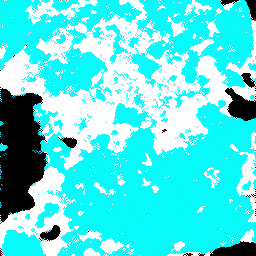
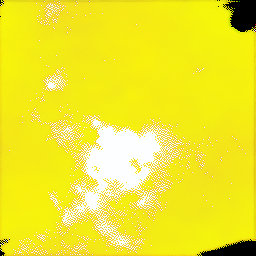
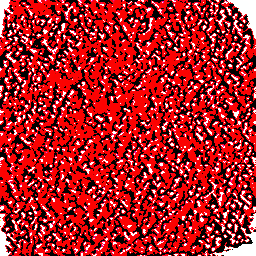
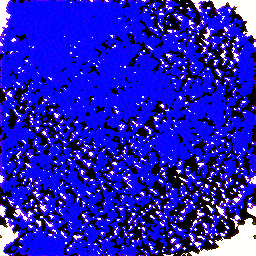

100%|██████████| 512/512 [00:20<00:00, 25.60it/s]



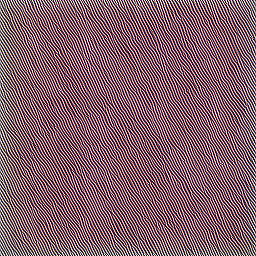
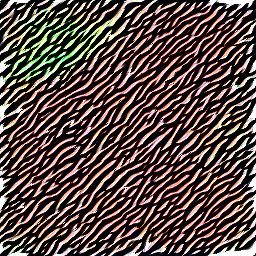
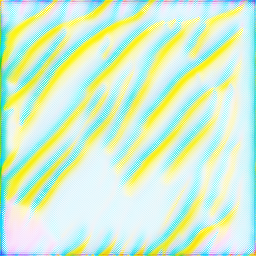
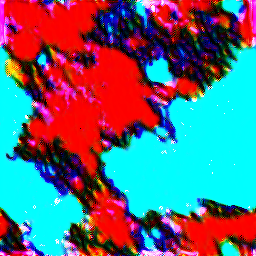

100%|██████████| 512/512 [00:18<00:00, 27.04it/s]



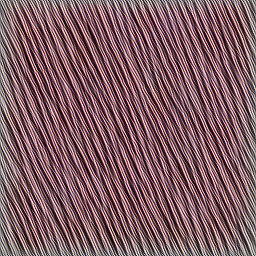
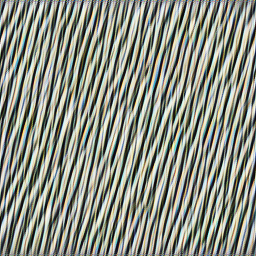
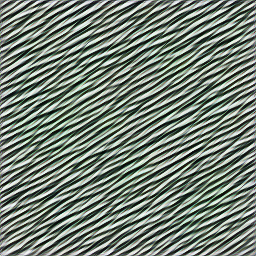
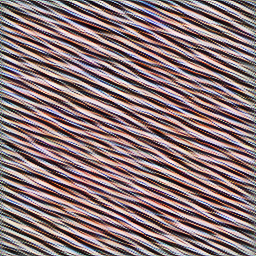

100%|██████████| 512/512 [00:19<00:00, 25.71it/s]



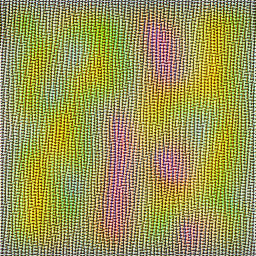
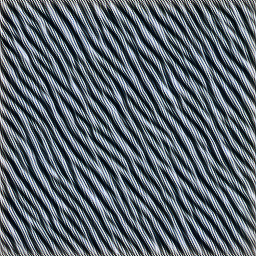
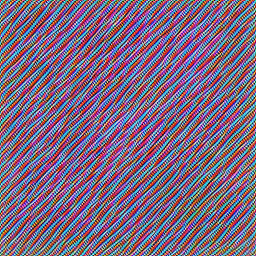
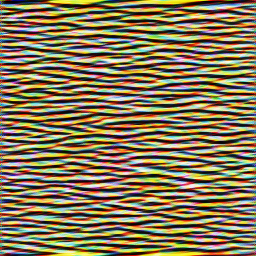

In [27]:
runDiversity('Conv2d_1a_3x3', 24)

runDiversity('Conv2d_2b_3x3', 24)

runDiversity('Conv2d_3b_1x1', 24)

runDiversity('Conv2d_4a_3x3', 24)

100%|██████████| 512/512 [00:19<00:00, 25.92it/s]



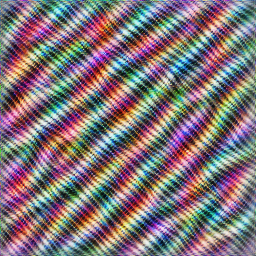
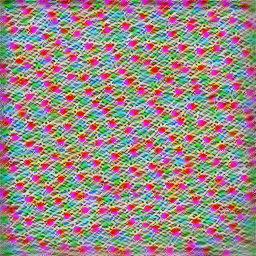
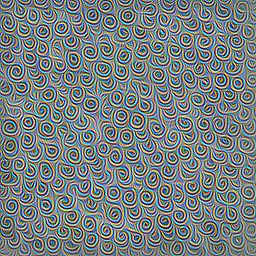
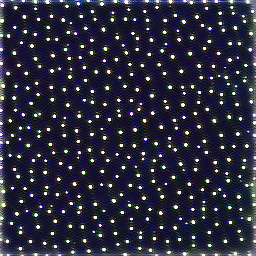

100%|██████████| 512/512 [00:20<00:00, 24.50it/s]



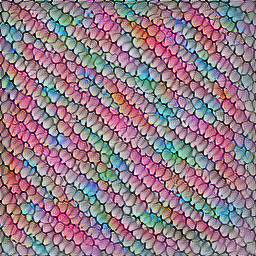
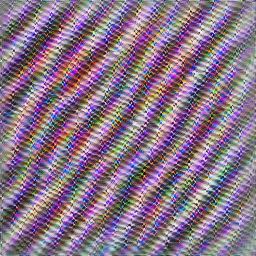
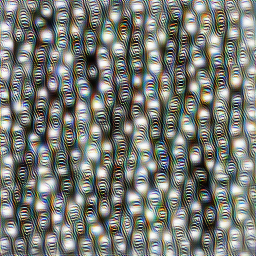
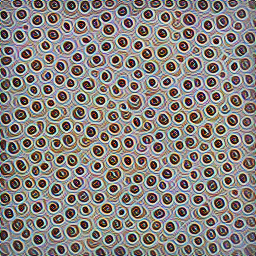

100%|██████████| 512/512 [00:21<00:00, 23.36it/s]



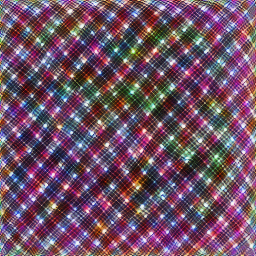
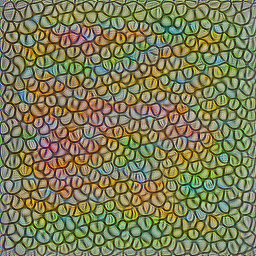
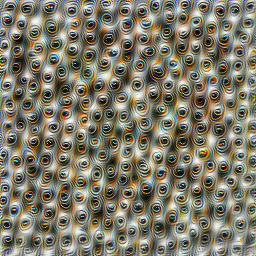
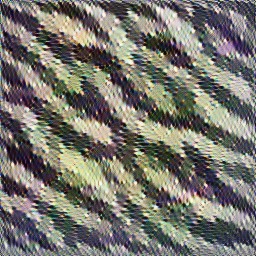

In [19]:
runDiversity('Mixed_5b', 255)

runDiversity('Mixed_5c', 123)

runDiversity('Mixed_5d', 224)

100%|██████████| 512/512 [00:23<00:00, 21.52it/s]



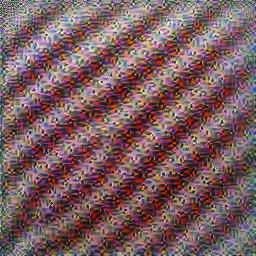
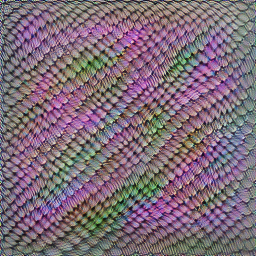
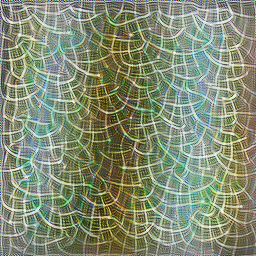
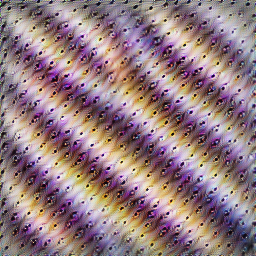

100%|██████████| 512/512 [00:25<00:00, 20.28it/s]



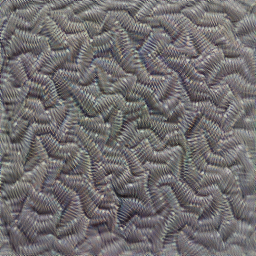
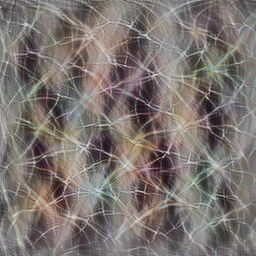
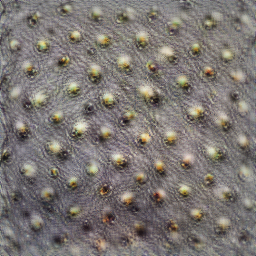
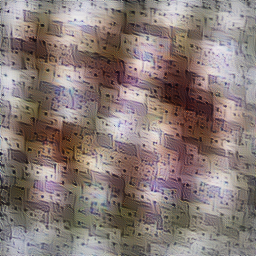

100%|██████████| 512/512 [00:26<00:00, 19.10it/s]



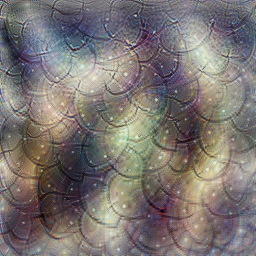
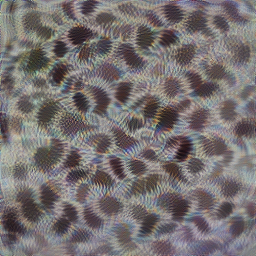
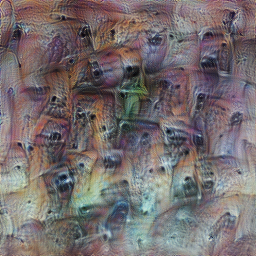
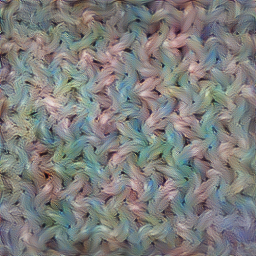

100%|██████████| 512/512 [00:28<00:00, 18.00it/s]



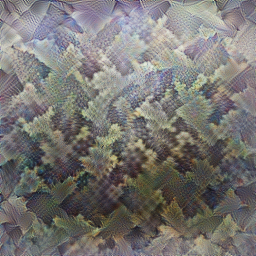
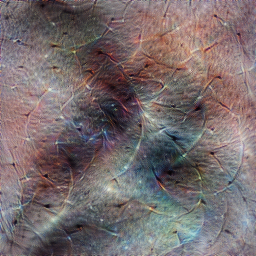
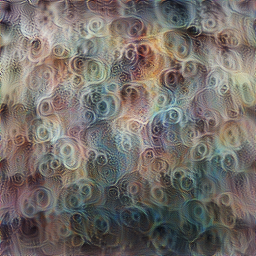
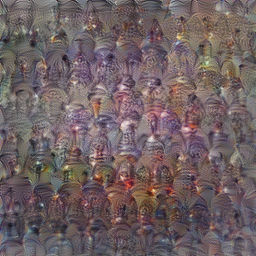

100%|██████████| 512/512 [00:29<00:00, 17.08it/s]



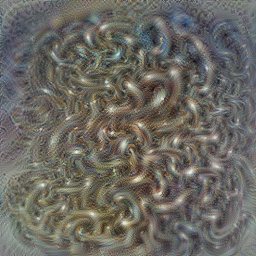
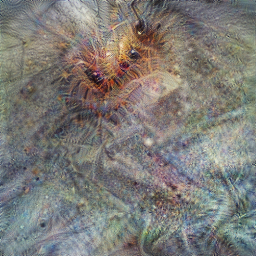
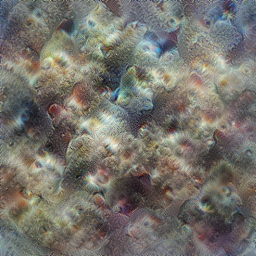
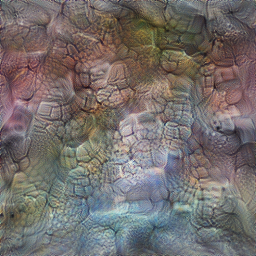

In [20]:
runDiversity('Mixed_6a', 255)

runDiversity('Mixed_6b', 123)

runDiversity('Mixed_6c', 224)

runDiversity('Mixed_6d', 123)

runDiversity('Mixed_6e', 224)

100%|██████████| 512/512 [00:34<00:00, 15.01it/s]



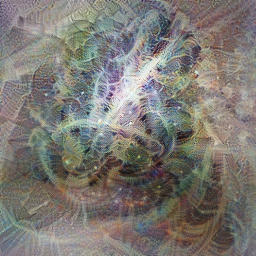
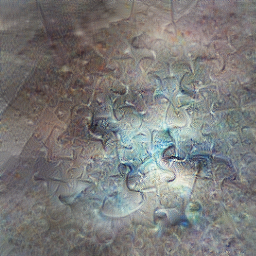
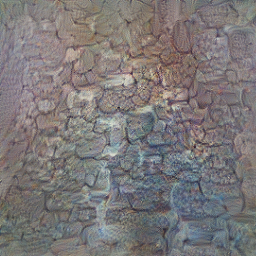
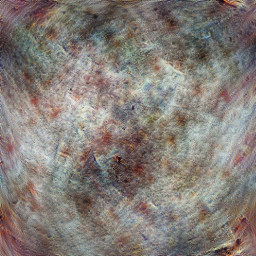

100%|██████████| 512/512 [00:41<00:00, 12.36it/s]



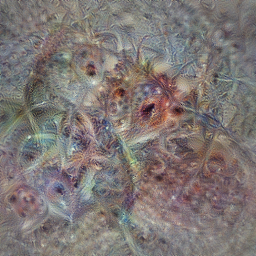
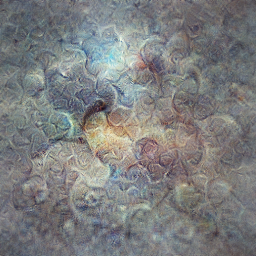
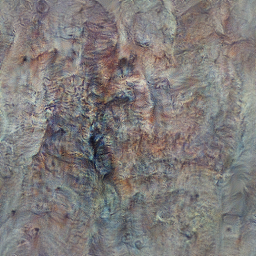
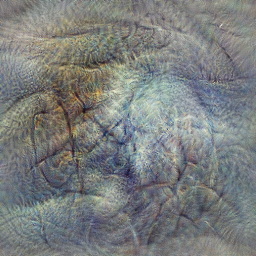

100%|██████████| 512/512 [00:42<00:00, 11.92it/s]



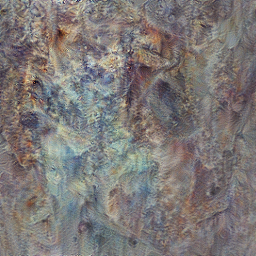
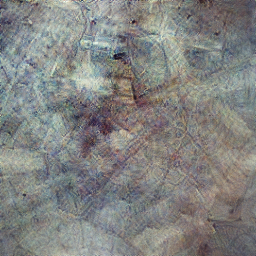
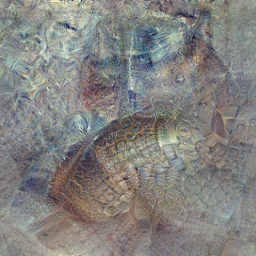
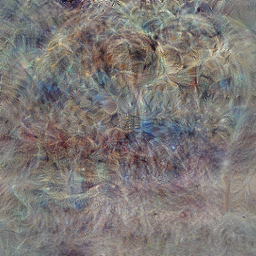

In [29]:
runDiversity('Mixed_7a', 214)

runDiversity('Mixed_7b', 1035)

runDiversity('Mixed_7c', 863)